In [1]:
from glob import glob
import os
import scanpy as sc
import numpy as np
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from scipy.linalg import eigh
from matplotlib.colors import TwoSlopeNorm
import matplotlib as mpl
import gseapy as gp

In [2]:
figpath = '/stanley/WangLab/kamal/figures/projects/manifesto/regions_mas/'
os.makedirs(figpath, exist_ok=True)
dpi = 500

# Load

In [3]:
paths = glob('/stanley/WangLab/kamal/data/technologies/starmap/mouse_ad/filtered/*juxtacrine_dual.h5ad')
adatas = [sc.read_h5ad(path) for path in paths]

In [4]:
adatas

[AnnData object with n_obs × n_vars = 8034 × 2766
     obs: 'top_level_cell_type', 'sub_level_cell_type', 'sample', 'condition', 'age', 'n_counts'
     uns: 'age_colors', 'condition_colors', 'log1p'
     obsm: 'spatial'
     layers: 'juxtacrine_dual',
 AnnData object with n_obs × n_vars = 8506 × 2766
     obs: 'top_level_cell_type', 'sub_level_cell_type', 'sample', 'condition', 'age', 'n_counts'
     uns: 'age_colors', 'condition_colors', 'log1p'
     obsm: 'spatial'
     layers: 'juxtacrine_dual',
 AnnData object with n_obs × n_vars = 8202 × 2766
     obs: 'top_level_cell_type', 'sub_level_cell_type', 'sample', 'condition', 'age', 'n_counts'
     uns: 'age_colors', 'condition_colors', 'log1p'
     obsm: 'spatial'
     layers: 'juxtacrine_dual',
 AnnData object with n_obs × n_vars = 9803 × 2766
     obs: 'top_level_cell_type', 'sub_level_cell_type', 'sample', 'condition', 'age', 'n_counts'
     uns: 'age_colors', 'condition_colors', 'log1p'
     obsm: 'spatial'
     layers: 'juxtacrine

In [5]:
filter_key = 'juxtacrine_dual'
max_mag = 2

for i in range(len(adatas)):

    # Scale
    sc.pp.scale(adatas[i], layer=filter_key)

    # Clip
    X = adatas[i].layers[filter_key]
    X[X > max_mag] = max_mag
    X[X < -max_mag] = -max_mag

adata = sc.concat(adatas)

In [6]:
# Set figure size
width = adata.obsm['spatial'][:,0].ptp()
height = adata.obsm['spatial'][:,1].ptp()
set_width = 15
fignorm = set_width / width
sc.set_figure_params(figsize=(set_width, height*fignorm))
figsize=(set_width, height*fignorm)

# Disease-specific regions

## Embedding

In [7]:
def embed(adata, samples1, samples2, n_comps, filter_key):

    adata1 = adata[np.isin(adata.obs['sample'],samples1)]
    adata2 = adata[np.isin(adata.obs['sample'],samples2)]

    X = adata1.layers[filter_key]
    X -= X.mean(axis=0)
    A = X.T @ X

    X_ = adata2.layers[filter_key]
    X_ -= X_.mean(axis=0)
    B = X_.T @ X_

    w,V = eigh(A,B)
    w = w[::-1]
    V = V[:,::-1]

    V = V[:,:n_comps]
    adata.obsm[f'X_pca_{filter_key}'] = adata.layers[filter_key] @ V
    adata.varm[f'X_pca_{filter_key}'] = V
    adata.uns[f'comp_var_{filter_key}'] = w

    return V

In [8]:
samples = adata.obs['sample'].unique()
samples1 = [sample for sample in samples if 'disease' in sample]
samples2 = [sample for sample in samples if 'control' in sample]

In [9]:
n_comps = 3

V = embed(adata, samples1, samples2, n_comps, filter_key)

## Plot PCs

==================== PC1 ====================


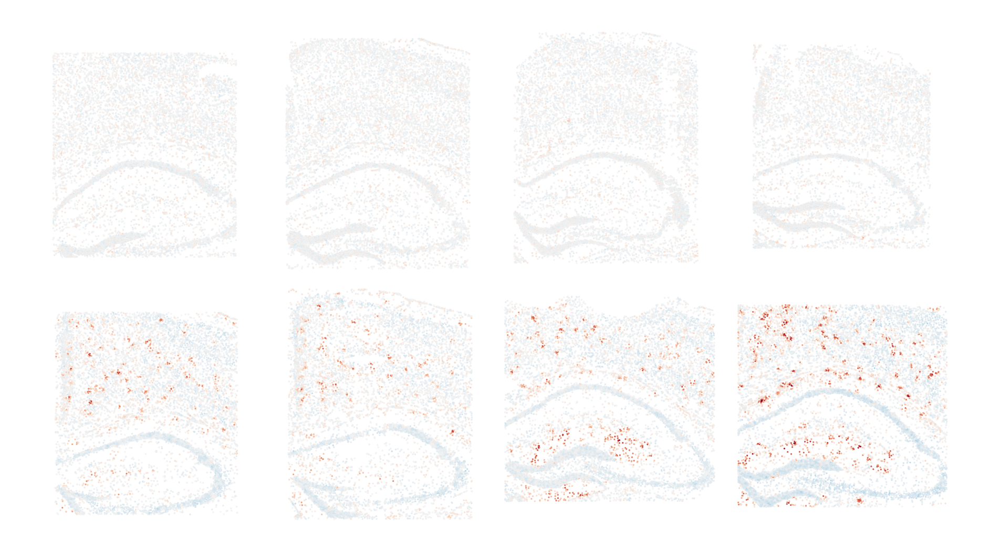

Positive markers:  ['P2ry12', 'Dcn', 'Stab1', 'Slc2a5', 'Ecscr', 'Gpr34', 'Lpar6', 'Selplg', 'Siglech', 'Foxp2']
Negative markers:  ['Cst7', 'Clec7a', 'Ccl3', 'Trem2', 'Lyz2', 'Gfap', 'Ctsd', 'Cd68', 'Ctsl', 'Baiap2l2']



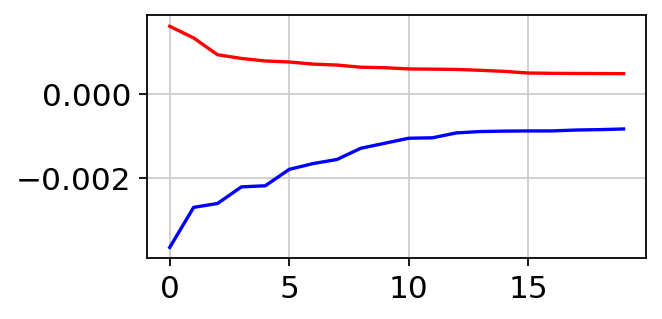

==================== PC2 ====================


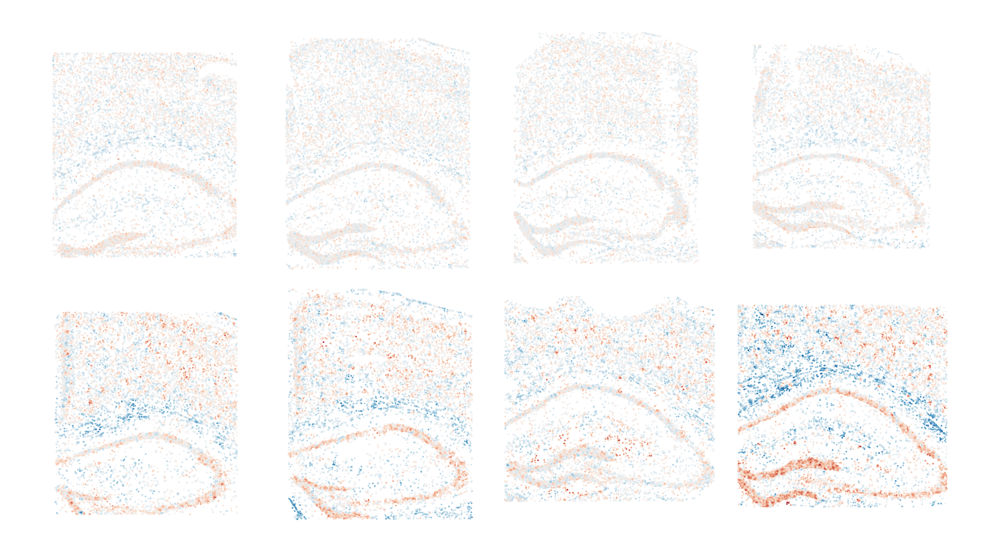

Positive markers:  ['Gfap', 'Vim', 'Serpina3n', 'Adamts4', 'C4b', 'Ggta1', 'Ccna1', 'Ptpn3', 'Sox8', 'Neat1']
Negative markers:  ['Cst7', 'Dapk1', 'Osr1', 'Cd68', 'Slc18a3', 'Mdm2', 'Baiap2l2', 'Trem2', 'Dgcr8', 'Adamts1']



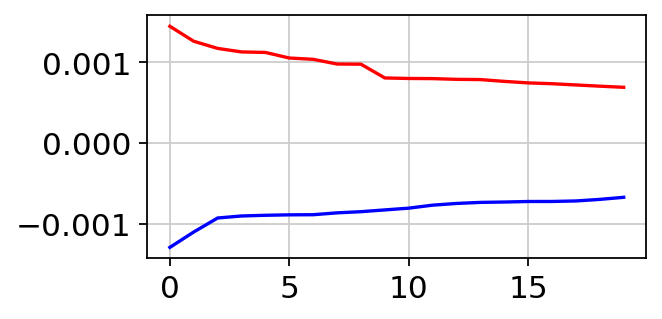

==================== PC3 ====================


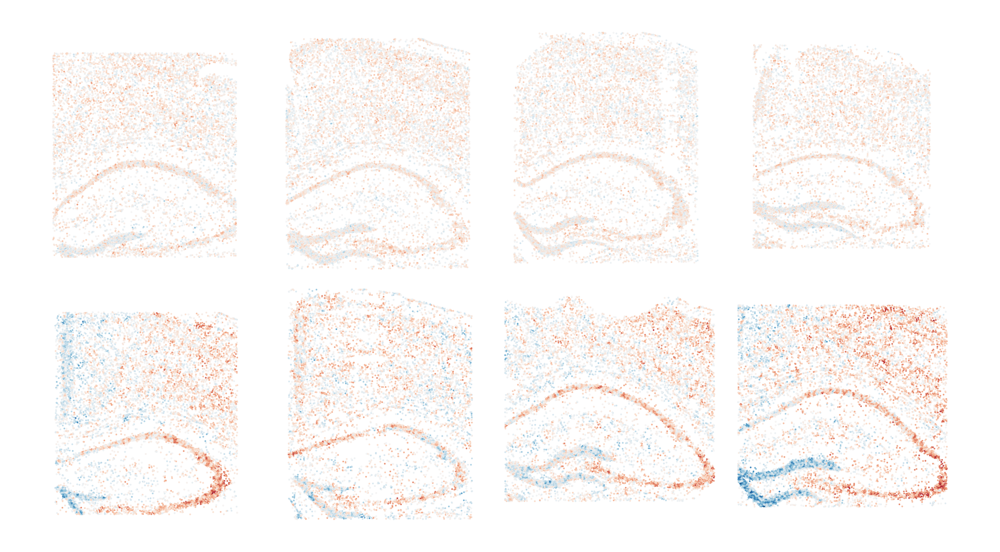

Positive markers:  ['Erc1', 'Actn2', 'Fkbp5', 'Nccrp1', 'Ly6d', 'Bcr', 'Dapk1', 'Marcksl1', 'Grin2a', 'Pdzk1ip1']
Negative markers:  ['Slc1a7', 'Il23a', 'Atp6v1g2', 'Nrgn', 'Hs3st4', 'Wif1', 'Ccl24', 'Rasl11a', 'Wasl', 'Cd52']



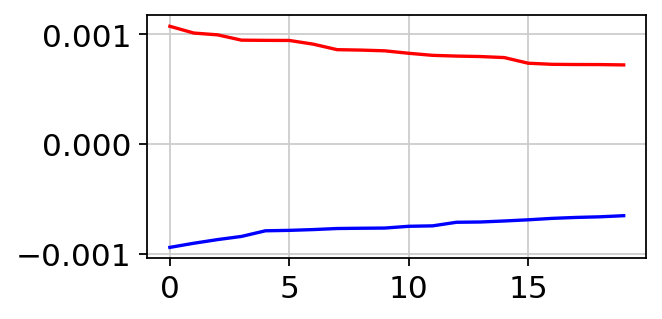

In [20]:
n_markers = 10
cmap = 'RdBu'

for i in range(n_comps):

    print('='*20, f'PC{i+1}', '='*20)

    # Calculate PC
    c = adata.layers[filter_key] @ V[:,i]
    adata.obs[f'c{i}'] = c

    # Plot in tissue
    cmax = np.abs(c).max()
    # norm = TwoSlopeNorm(vcenter=0, vmin=c.min(), vmax=c.max())
    norm = TwoSlopeNorm(vcenter=0, vmin=-cmax, vmax=cmax)
    points = adata.obsm['spatial']
    plt.figure(figsize=figsize)
    plt.scatter(
        points[:,0],
        points[:,1],
        edgecolor='k',
        linewidth=0.005,
        s=2,
        c=c,
        cmap=cmap,
        norm=norm,
    )
    plt.axis('off')
    filename = os.path.join(figpath, f'region_pc{i+1}.png')
    plt.savefig(filename, dpi=dpi)
    plt.show()
    
    # Print markers
    marker_idxs = np.argsort(V[:,i])
    pos_marker_genes = adata.var_names[marker_idxs[::-1]][:n_markers]
    neg_marker_genes = adata.var_names[marker_idxs][:n_markers]
    print('Positive markers: ', list(pos_marker_genes))
    print('Negative markers: ', list(neg_marker_genes))
    print()
    
    # Print weights
    plt.figure(figsize=(4,2))
    plt.plot(np.sort(V[:,i])[::-1][:20], c='r')
    plt.plot(np.sort(V[:,i])[:20], c='b')
    plt.show()

### Zoom 1

In [12]:
i = 0
c = adata.obs[f'c{i}']
norm = TwoSlopeNorm(vcenter=0, vmin=c.min(), vmax=c.max())

In [13]:
# Set zoom dims
width = adata.obsm['spatial'][:,0].ptp()
height = adata.obsm['spatial'][:,1].ptp()
zoom_width = height/3
zoom_height = zoom_width

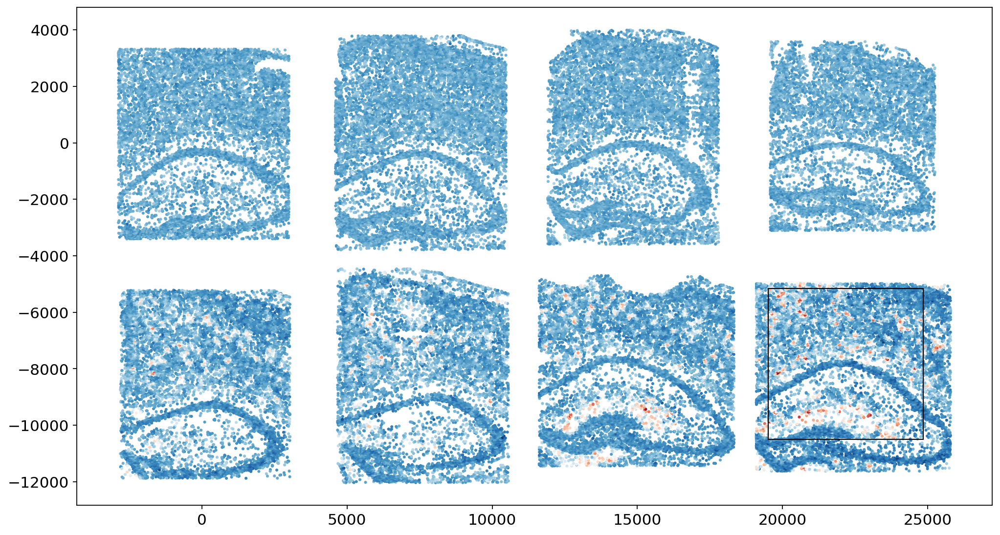

In [14]:
# # /8
# zoom_x = 21000
# zoom_y = -7100

# # /6
# zoom_x = 20500
# zoom_y = -7600

# # /5
# zoom_x = 12000
# zoom_y = -8200

# # /4
# zoom_x = 19300
# zoom_y = -9000

# /3
zoom_x = 19500
zoom_y = -10500

plt.figure(figsize=figsize)
plt.scatter(*adata.obsm['spatial'].T, s=3, c=c, cmap=cmap)
rect = mpl.patches.Rectangle((zoom_x, zoom_y), zoom_width, zoom_height, edgecolor='k', fill=False)
plt.gca().add_patch(rect)
plt.grid(None)
plt.show()

In [15]:
zdata = adata[adata.obsm['spatial'][:,0]>zoom_x]
zdata = zdata[zdata.obsm['spatial'][:,0]<zoom_x+zoom_width]
zdata = zdata[zdata.obsm['spatial'][:,1]>zoom_y]
zdata = zdata[zdata.obsm['spatial'][:,1]<zoom_y+zoom_height]

In [18]:
c = zdata.obs[f'c{i}']
# znorm = TwoSlopeNorm(vcenter=0, vmin=c.min(), vmax=c.max())
cmax = np.abs(c).max()
znorm = TwoSlopeNorm(vcenter=0, vmin=-cmax, vmax=cmax)

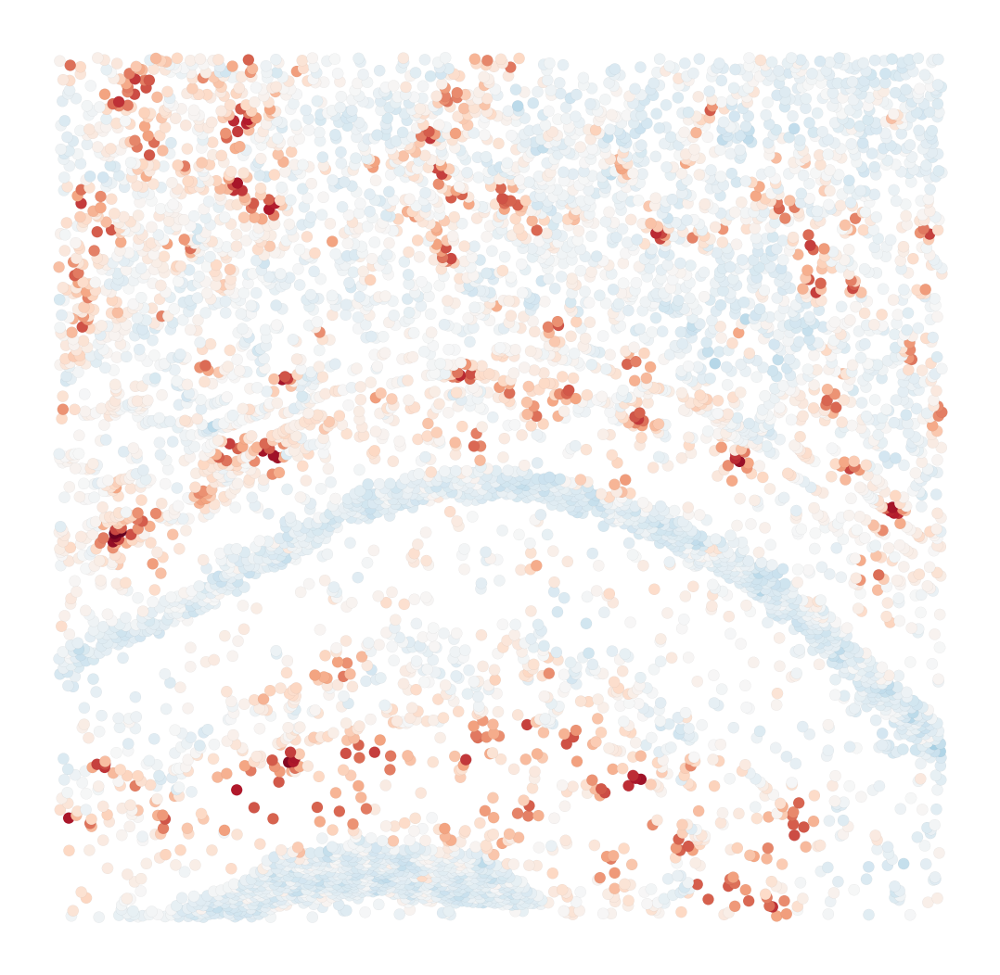

In [19]:
points = zdata.obsm['spatial']
plt.figure(figsize=(height*fignorm*(zoom_width/zoom_height), height*fignorm))
plt.scatter(
    points[:,0],
    points[:,1],
    edgecolor='k',
    linewidth=0.01,
    s=30,
    c=zdata.obs[f'c{i}'],
    cmap=cmap,
    norm=znorm,
)
plt.axis('off')
filename = os.path.join(figpath, f'region_zoom2.png')
plt.savefig(filename, dpi=dpi)
plt.show()

# Clustering

In [11]:
# n_pcs = 5
# pca = PCA(n_components=n_pcs, random_state=0)
# adata.obsm[f'X_pca_{filter_key}'] = pca.fit_transform(adata.layers[filter_key])
# adata.varm[f'X_pca_{filter_key}'] = pca.components_.T

In [20]:
n_regions = 2
# n_regions = 3
kmeans = KMeans(n_clusters=n_regions, random_state=0)
kmeans.fit(adata.obsm[f'X_pca_{filter_key}'])
adata.obs['region'] = kmeans.labels_.astype(str)

/stanley/WangLab/kamal/envs/xax/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


## Plot markers

In [21]:
sc.tl.rank_genes_groups(adata, groupby='region', layer=filter_key)
sc.tl.dendrogram(adata, groupby='region', use_rep=f'X_pca_{filter_key}')

/home/unix/kmaher/.local/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:455: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/home/unix/kmaher/.local/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:455: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(


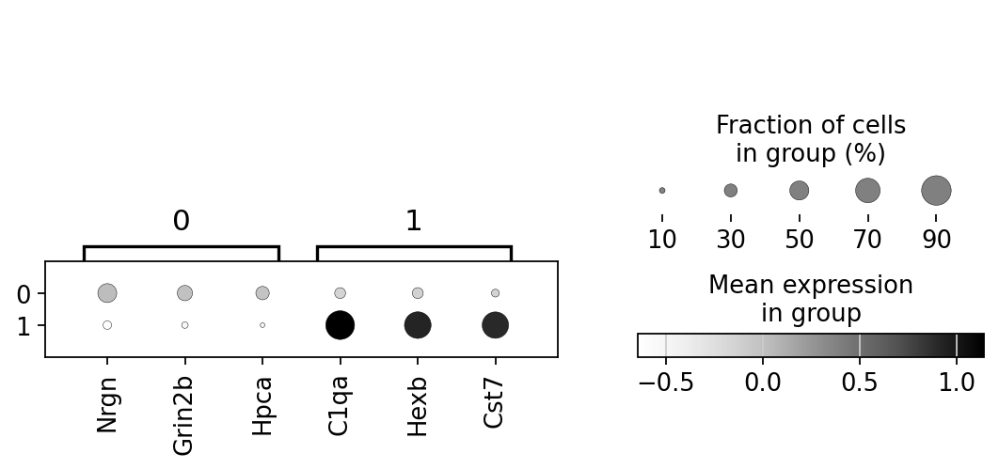

In [22]:
fig = plt.figure(figsize=(8,3))
ax = plt.gca()
sc.pl.rank_genes_groups_dotplot(adata, groupby='region', n_genes=3, layer=filter_key, ax=ax, cmap='Greys')
figname = 'region_markers.png'
savepath = os.path.join(figpath, figname)
fig.savefig(savepath, dpi=dpi, bbox_inches='tight')

## Plot tissue

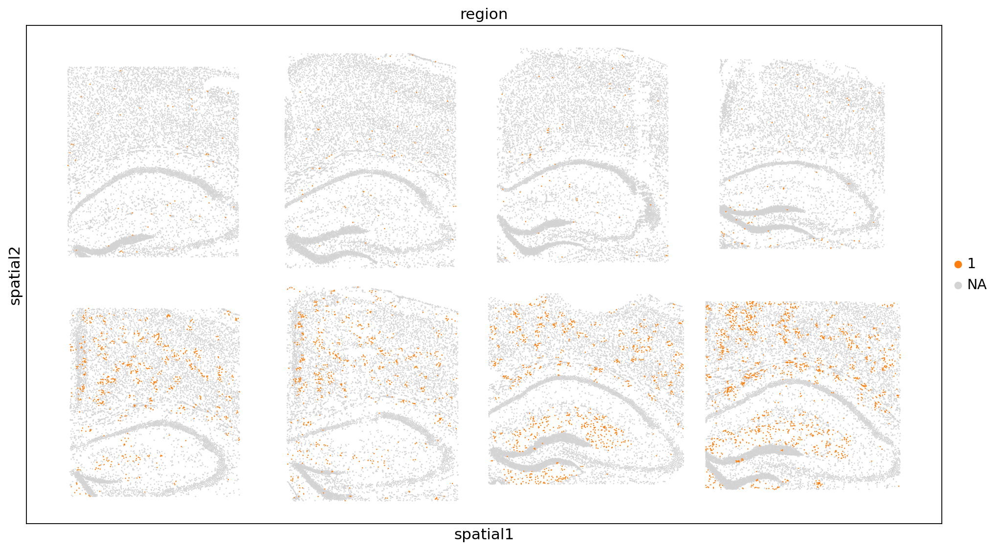

In [24]:
sc.pl.embedding(
    adata,
    basis='spatial',
    color='region',
    groups='1',
    s=5
)

In [25]:
adata.obs['is_plaque'] = adata.obs['region'] == '1'
sorted_idxs = np.argsort(adata.obs['is_plaque']).values
adata = adata[sorted_idxs]

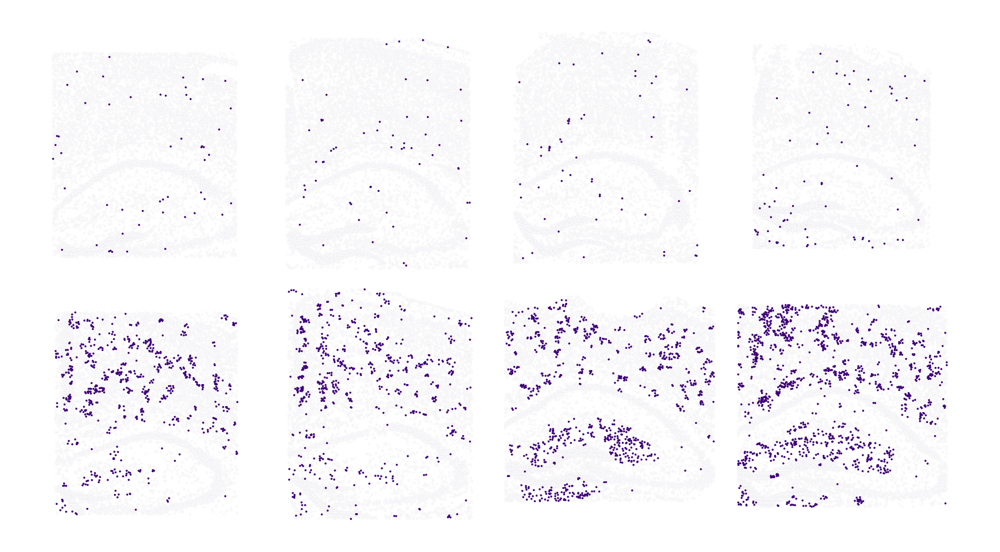

In [26]:
points = adata.obsm['spatial']
plt.figure(figsize=figsize)
plt.scatter(
    points[:,0],
    points[:,1],
    edgecolor='k',
    linewidth=0.01,
    s=3,
    c=adata.obs['is_plaque'],
    cmap='Purples'
)
plt.axis('off')
filename = os.path.join(figpath, f'regions.png')
plt.savefig(filename, dpi=dpi)
plt.show()

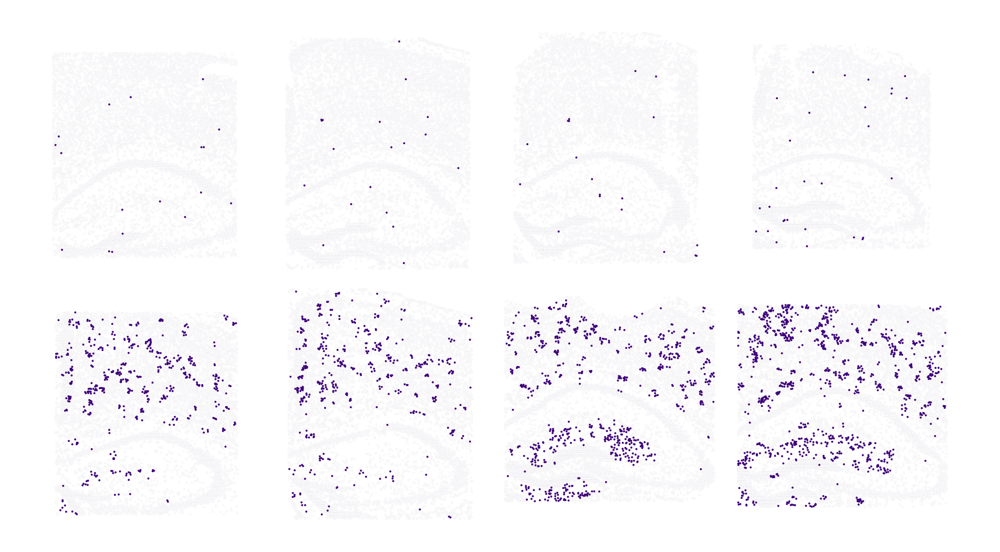

In [17]:
points = adata.obsm['spatial']
plt.figure(figsize=figsize)
plt.scatter(
    points[:,0],
    points[:,1],
    edgecolor='k',
    linewidth=0.01,
    s=3,
    c=adata.obs['is_plaque'],
    cmap='Purples'
)
plt.axis('off')
filename = os.path.join(figpath, f'regions.png')
plt.savefig(filename, dpi=dpi)
plt.show()

### Zoom

In [18]:
# Set zoom dims
width = adata.obsm['spatial'][:,0].ptp()
height = adata.obsm['spatial'][:,1].ptp()
zoom_width = height/5
zoom_height = zoom_width

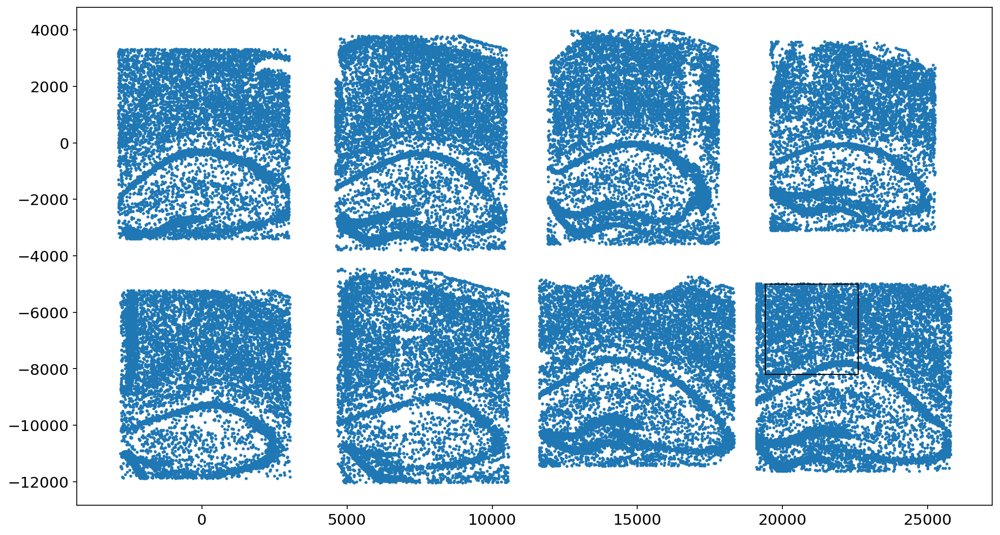

In [19]:
# # /8
# zoom_x = 21000
# zoom_y = -7100

# # /6
# zoom_x = 20500
# zoom_y = -7600

# /5
zoom_x = 19400
zoom_y = -8200

# # /4
# zoom_x = 19300
# zoom_y = -9000

plt.figure(figsize=figsize)
plt.scatter(*adata.obsm['spatial'].T, s=3)
rect = mpl.patches.Rectangle((zoom_x, zoom_y), zoom_width, zoom_height, edgecolor='k', fill=False)
plt.gca().add_patch(rect)
plt.grid(None)
plt.show()

In [20]:
zdata = adata[adata.obsm['spatial'][:,0]>zoom_x]
zdata = zdata[zdata.obsm['spatial'][:,0]<zoom_x+zoom_width]
zdata = zdata[zdata.obsm['spatial'][:,1]>zoom_y]
zdata = zdata[zdata.obsm['spatial'][:,1]<zoom_y+zoom_height]

In [21]:
sorted_idxs = np.argsort(zdata.obs['is_plaque']).values

In [22]:
zdata[sorted_idxs].obs

,top_level_cell_type,sub_level_cell_type,sample,condition,age,n_counts,c0,c1,c2,region,is_plaque
NAME,,,,,,,,,,,
39558,CTX-Ex,CTX-Ex3,13months-disease-replicate_1,disease,13months,540.0,0.020044,0.004155,-0.003553,1,False
37743,CTX-Ex,CTX-Ex2,13months-disease-replicate_1,disease,13months,138.0,-0.007601,0.006678,-0.008062,2,False
37742,CTX-Ex,CTX-Ex3,13months-disease-replicate_1,disease,13months,632.0,-0.005945,0.012029,0.013673,2,False
37741,Inh,Pvalb,13months-disease-replicate_1,disease,13months,395.0,0.003410,-0.000157,-0.001428,1,False
37736,Oligo,Oligo3,13months-disease-replicate_1,disease,13months,353.0,-0.004667,0.012500,0.000366,2,False
...,...,...,...,...,...,...,...,...,...,...,...
38170,Endo,Endo3,13months-disease-replicate_1,disease,13months,100.0,-0.038238,-0.019072,-0.007525,0,True
38174,Micro,Micro1,13months-disease-replicate_1,disease,13months,553.0,-0.051951,-0.002762,0.007144,0,True
38258,Micro,Micro1,13months-disease-replicate_1,disease,13months,55.0,-0.022470,0.003355,0.004486,0,True


In [23]:
zdata = zdata[sorted_idxs]

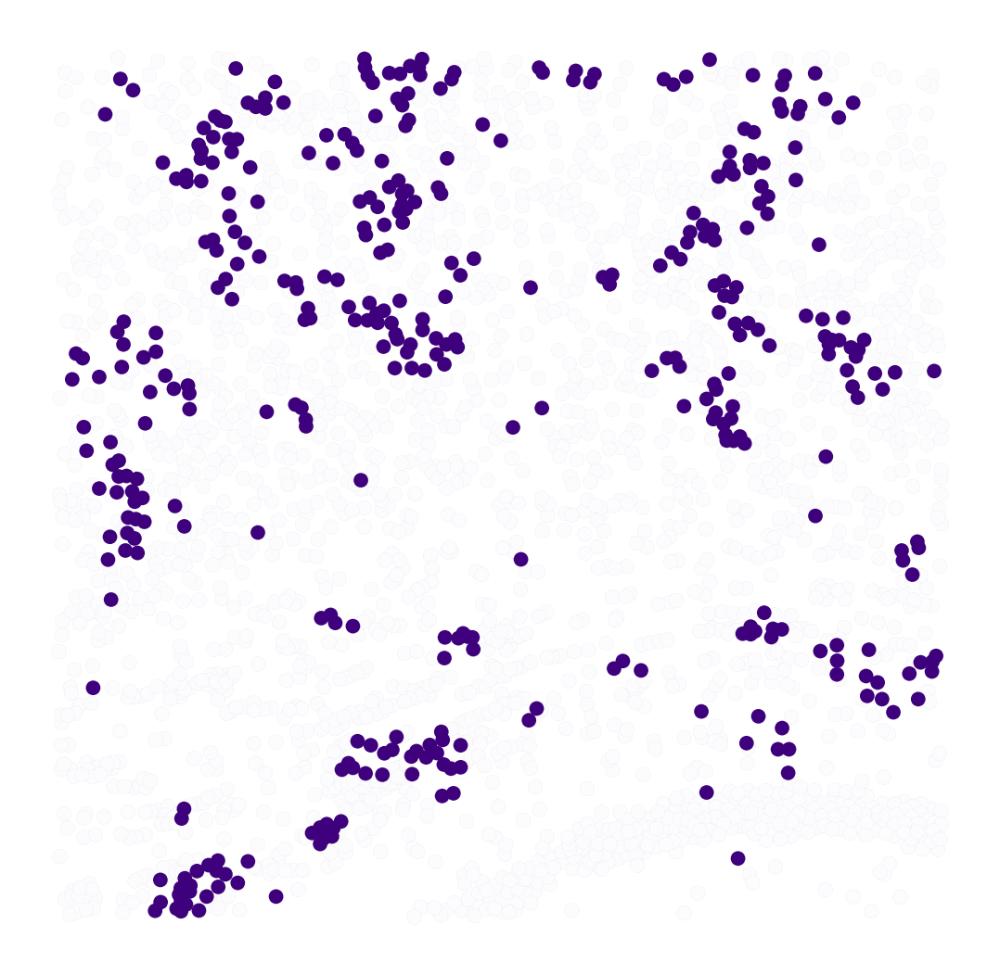

In [24]:
points = zdata.obsm['spatial']
plt.figure(figsize=(height*fignorm*(zoom_width/zoom_height), height*fignorm))
plt.scatter(
    points[:,0],
    points[:,1],
    edgecolor='k',
    linewidth=0.01,
    s=50,
    c=zdata.obs['is_plaque'],
    cmap='Purples'
)
plt.axis('off')
filename = os.path.join(figpath, f'region_zoom.png')
plt.savefig(filename, dpi=dpi)
plt.show()